# Entropy Estimation of Bipatrite Qubits Pure States

In [34]:
# Importing necessary libraries

from utils import *
from qiskit import QuantumCircuit, QuantumRegister, ClassicalRegister
from qiskit.primitives import Sampler
from qiskit_aer import AerSimulator
from qiskit.transpiler.preset_passmanagers import generate_preset_pass_manager
from qiskit.quantum_info import Statevector, Operator
from qiskit.circuit.classical import expr
from qiskit.circuit.library import UnitaryGate
from qiskit_ibm_runtime.fake_provider import FakeBrisbane
from qiskit_ibm_runtime import SamplerV2
from qiskit import transpile
from qiskit.visualization import plot_histogram, plot_error_map, plot_distribution, circuit_drawer

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'svg'

import seaborn as sns
sns.set_style('dark')

## Realization of Global Unitary $U_G$

We will decompose $U_G$ with **CNOT**, **Toffoli**, **CCZ** and **RY** gates

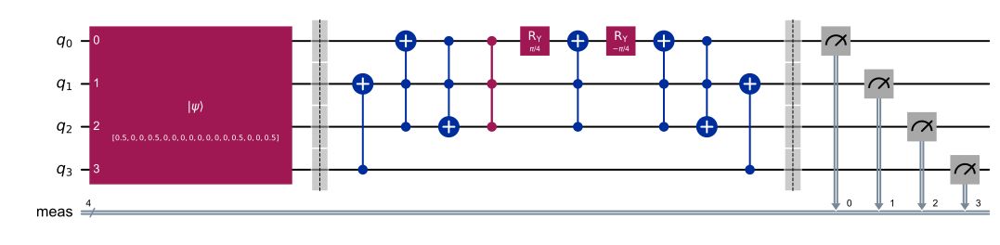

In [3]:
qc = QuantumCircuit(4)

#  Initialization with a random quantum state
initial_state = Statevector(np.sqrt(0.5)*np.array([1, 0, 0, 1]))
tensor_state = initial_state^initial_state
qc.initialize(tensor_state) # to initialize with any state

qc.barrier()
qc.cx(3, 1)
qc.ccx(2, 1, 0)
qc.ccx(1, 0, 2)
qc.ccz(1, 2, 0)
qc.ry(np.pi/4, 0)   ########################
qc.ccx(2, 1, 0)     ## Realizing CCH Gate ## 
qc.ry(-np.pi/4, 0)  ########################
qc.ccx(2, 1, 0)
qc.ccx(0, 1, 2)
qc.cx(3, 1)
qc.measure_all()
qc.draw('mpl')

### Noiseless Estimation - Ideal

COUNTS : 
 {'0 1 1 0': 5567, '1 1 1 1': 10812, '0 0 0 0': 11231, '0 1 0 1': 11225, '1 1 0 0': 5487, '0 0 0 1': 11036, '1 1 0 1': 11007, '0 1 1 1': 11133, '0 1 0 0': 11342, '1 0 0 1': 5643, '0 0 1 1': 5517}



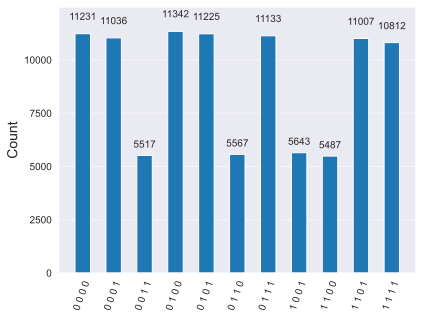

In [10]:
# Noiseless Simulation
n = 100000

aer_sim = AerSimulator()
pm = generate_preset_pass_manager(backend=aer_sim, optimization_level=1, seed_transpiler=20)
isa_qc = pm.run(qc)
job = aer_sim.run([isa_qc], shots=n, seed_simulator=20, memory=True)
result = job.result()
counts = result.get_counts()
print("COUNTS : \n", counts)
print()
plot_histogram(counts)

### LOCC Protocol

The following protocol applies a Local Unitary $U_L$ conditioned on the bitwise XOR operation of the classical bits $c_1 \text{ and } c_3$ on the post measurement states.

This is realized in *Qiskit* using the $\text{if\_test}$ conditional operator and the local unitary $U_L$ is decomposed using **CNOT**, **CZ** and **CH** gates.

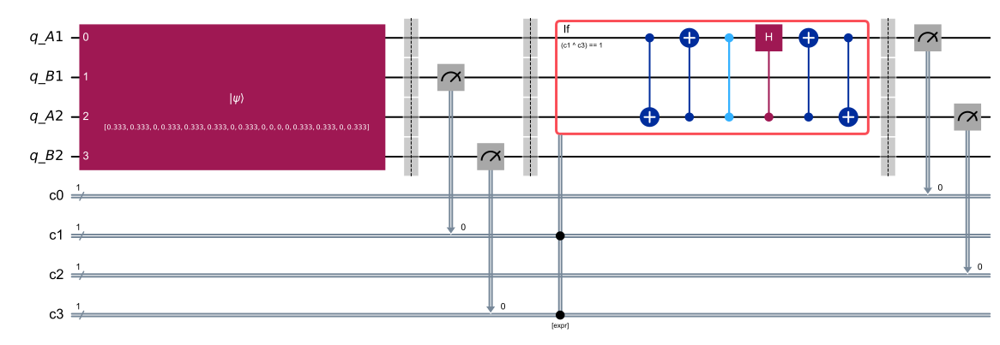

In [7]:
c0 = ClassicalRegister(1, name='c0')
c1 = ClassicalRegister(1, name='c1')
c2 = ClassicalRegister(1, name='c2')
c3 = ClassicalRegister(1, name='c3')
qa1 = QuantumRegister(1, name='q_A1')
qb1 = QuantumRegister(1, name='q_B1')
qa2 = QuantumRegister(1, name='q_A2')
qb2 = QuantumRegister(1, name='q_B2')

qc = QuantumCircuit(qa1, qb1, qa2, qb2, c0, c1, c2, c3)

# Initialization
initial_state = Statevector(np.sqrt(1/3)*np.array([1, 1, 0, 1]))
tensor_state = initial_state^initial_state
qc.initialize(tensor_state)

qc.barrier()
qc.measure(1, 1)
qc.measure(3, 3)
qc.barrier()

# Unitary operation conditioned on classical bits
with qc.if_test(expr.equal(expr.bit_xor(c1, c3), 1)):
    qc.cx(0, 2)
    qc.cx(2, 0)
    qc.cz(2, 0)
    qc.ch(2, 0)
    qc.cx(2, 0)
    qc.cx(0, 2)
    
qc.barrier()
qc.measure(0, 0)
qc.measure(2, 2)
qc.draw(output='mpl')

### Decomposition of local unitary $U_L$ 

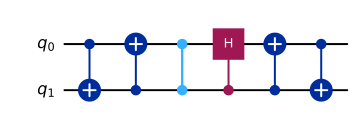

In [26]:
qcircuit = QuantumCircuit(2)
qcircuit.cx(0, 1)
qcircuit.cx(1, 0)
qcircuit.cz(0, 1)
qcircuit.ch(1, 0)
qcircuit.cx(1, 0)
qcircuit.cx(0, 1)
qcircuit.draw(output='mpl')

Efficient Decomposition of the local Unitary Operator $U_L$ using elementary gates

We decompose it using 6 CNOT gates and 8 single-qubit gates.

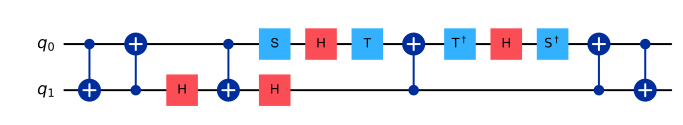

In [27]:
qcircuit.decompose().draw(output='mpl')

### Noiseless Estimation - (Ideal)

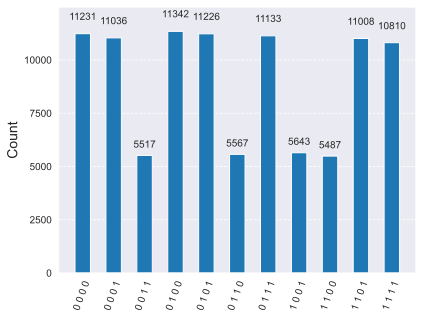

In [28]:
# No. of rounds
n = 100000

aer_sim = AerSimulator(shots=1000)
pm = generate_preset_pass_manager(backend=aer_sim, optimization_level=3, seed_transpiler=20)
isa_qc = pm.run(qc)
job = aer_sim.run([isa_qc], shots=n, seed_simulator=30, memory=True)
result = job.result()
memory_aer = result.get_memory()
plot_histogram(result.get_counts())

### Noisy Estimation - (Simulated Backend : IBM-Brisbane)

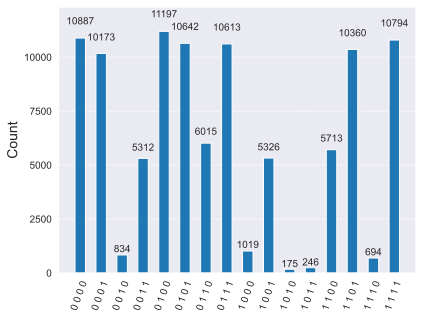

In [29]:
# No. of rounds
n = 100000

backend = FakeBrisbane()
pm = generate_preset_pass_manager(backend=backend, optimization_level=1, seed_transpiler=20)
isa_qc = pm.run(qc)
job = backend.run([isa_qc], shots=n, seed_simulator=30, memory=True)
result = job.result()
memory = result.get_memory()
plot_histogram(result.get_counts())

### Estimation on a Quantum Backend : IBM-Brisbane

In [30]:
from qiskit_ibm_runtime import SamplerV2, EstimatorV2, QiskitRuntimeService

In [33]:
# API_TOKEN = '<YOUR_API_TOKEN>'
# service = QiskitRuntimeService(
#     channel='ibm_quantum',
#     instance='ibm-q/open/main',
#     token=API_TOKEN
# )

service = QiskitRuntimeService()
backend = service.backend('ibm_brisbane')

In [19]:
pm = generate_preset_pass_manager(backend=backend, optimization_level=3, seed_transpiler=20)
isa_qc = pm.run(qc)
sampler = SamplerV2(backend)
job = sampler.run([isa_qc], shots=100000)
job_id = job.job_id()
print(f"job id: {job_id}")

In [37]:
job = service.job(job_id)
pub_result = job.result()[0]
memory_ibmq = post_process_ibmq(pub_result)

### Comparison in Estimation

We compares the estimates obtained from the above 3 setups and compare them

In [44]:
s_noisy_sim = np.array(compute_von_neuman_from_memory(memory))
s_noiseless = np.array(compute_von_neuman_from_memory(memory_aer))
s_ibm_backend = np.array(compute_von_neuman_from_memory(memory_ibmq))

# Reference Value 
true_s = von_neumann_S_from_k(1/9)

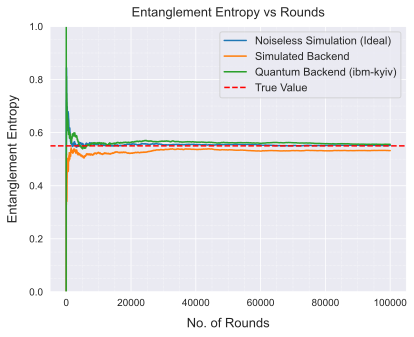

In [45]:
plt.plot(range(n), s_noiseless, label='Noiseless Simulation (Ideal)')
plt.plot(range(n), s_noisy_sim, label='Simulated Backend')
plt.plot(range(n), s_ibm_backend, label='Quantum Backend (ibm-kyiv)')
plt.axhline(true_s, ls='dashed', c='red', label='True Value')
plt.ylim(0,1)
plt.grid()
plt.grid(which='minor', ls=':', lw=0.5)
plt.minorticks_on()
plt.xlabel("No. of Rounds", labelpad=10, fontsize=13)
plt.ylabel("Entanglement Entropy", labelpad=10, fontsize=13)
plt.title("Entanglement Entropy vs Rounds", pad=10, size=13)
plt.legend(fontsize=11)
plt.show()

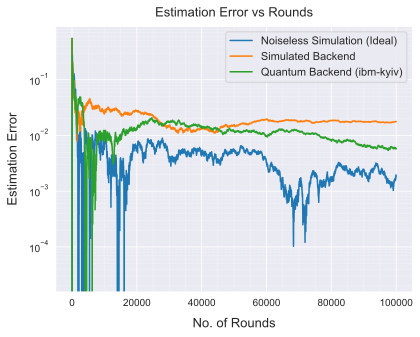

In [46]:
plt.semilogy(range(n), abs(true_s-s_noiseless), label='Noiseless Simulation (Ideal)')
plt.semilogy(range(n), abs(true_s-s_noisy_sim), label='Simulated Backend')
plt.semilogy(range(n), abs(true_s-s_ibm_backend), label='Quantum Backend (ibm-kyiv)')
plt.grid()
plt.grid(which='minor', ls=':', lw=0.5)
plt.minorticks_on()
plt.xlabel("No. of Rounds", labelpad=10, fontsize=13)
plt.ylabel("Estimation Error", labelpad=10, fontsize=13)
plt.title("Estimation Error vs Rounds", pad=10, size=13)
plt.legend(fontsize=11)
plt.show()

### Error Bounds :
Hoeffding's Concentration Bounds

We need $\mathcal{O}(\frac{\log(\frac{1}{\delta})}{\epsilon^2})$ samples to estimate $\beta$ upto an accuracy of $\epsilon$ with probability at least $1-\delta$

$$ \mathbb{P}(|\hat{\beta} - \beta| \geq \epsilon) \leq 2\exp(-2n\epsilon^2) = \delta $$

No. of Rounds:

$$ n \geq \dfrac{\log(\frac{2}{\delta})}{2\epsilon^2}$$

We have $ n_{\text{copies}} = 2n $

No. of copies:

$$ n_{\text{copies}} \geq \dfrac{\log(\frac{2}{\delta})}{\epsilon^2}$$

In [47]:
def hoeffding_bound(error_prob, n):
    return np.sqrt((1/2)*np.log(2/error_prob)*(1/n))

In [53]:
ucb, lcb = estimate_bounds_from_memory(memory_aer, error_prob=0.01)
ucb_weak, lcb_weak = estimate_bounds_from_memory(memory_aer, error_prob=0.1)
s_noiseless = np.array(compute_von_neuman_from_memory(memory_aer))
s_lcb = np.array([von_neumann_S_from_k(l) for l in lcb])
s_ucb = np.array([von_neumann_S_from_k(u) for u in ucb])
s_lcb_weak = np.array([von_neumann_S_from_k(l) for l in lcb_weak])
s_ucb_weak = np.array([von_neumann_S_from_k(u) for u in ucb_weak])
true = von_neumann_S_from_k(1/9)

In [55]:
n=100000
plt.plot(range(n), s_noiseless, color='blue', label='Estimated Entropy')
plt.fill_between(range(n), s_lcb, s_ucb, alpha=0.7, label='Confidence Interval $(\delta=0.01)$')
plt.fill_between(range(n), s_lcb_weak, s_ucb_weak, alpha=0.4, label='Confidence Interval $(\delta=0.1)$')
plt.axhline(true, ls='dashed', color='red', label='True Entropy Value', alpha=0.7)
plt.grid()
plt.grid(which='minor', ls=':', lw=0.5)
plt.minorticks_on()
plt.ylim(0,1)
plt.xlabel("No. of Rounds", labelpad=10, fontsize=13)
plt.ylabel("Entanglement Entropy", labelpad=10, fontsize=13)
plt.title("Entanglement Entropy vs Rounds", pad=10, size=13)
plt.legend(fontsize=11)
plt.show()

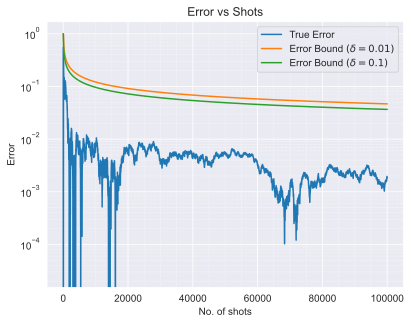

In [57]:
error_prob = 0.01
n = np.array(range(1, 100000+1))
err = abs(s_noiseless - true)
bound = [von_neumann_S_from_k(hoeffding_bound(error_prob, i)) for i in n]
bound2 = [von_neumann_S_from_k(hoeffding_bound(0.1, i)) for i in n]

plt.semilogy(n, err, label='True Error')
plt.semilogy(n, bound, label='Error Bound $(\delta = 0.01)$')
plt.semilogy(n, bound2, label='Error Bound $(\delta = 0.1)$')
plt.grid()
plt.grid(which='minor', ls=':', lw=0.5)
plt.minorticks_on()
plt.xlabel("No. of shots")
plt.ylabel("Error")
plt.title("Error vs Shots")
plt.legend()
plt.show()